In [1327]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
from pandas.plotting import scatter_matrix

plt.style.use('ggplot')
%matplotlib inline
pd.options.display.max_rows = 85
pd.options.display.max_columns = 200

# 1. Data Cleaning

In [2]:
dftrain = pd.read_csv('data/train_set.csv')
dftest = pd.read_csv('data/test_set.csv')

dftrain.drop(dftrain.columns[0], axis=1, inplace=True)
dftest.drop(dftest.columns[0], axis=1, inplace=True)

In [3]:
# Test set had additional columns after converting from Apple's Number app. Dropping those.
dftest.drop(dftest.columns[[33,34,35]], axis=1, inplace=True)

In [4]:
# Filtering out columns with NaN to 0. 
# Confirmed that all stats value with NaN(0) are due to 0 attempts.

fill_col = ['FG%', '3P%', '2P%', 'eFG%', 'FT%']
dftrain[fill_col] = dftrain[fill_col].fillna(value=0)
dftest[fill_col] = dftest[fill_col].fillna(value=0)

### 370 rows were deleted due to no salary info. This accounts to 4.2% of data loss.


In [5]:
nosal = dftrain['Salary'].isnull()
no_sal_df = dftrain[nosal]
no_sal_df

,id,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Salary,Year,SalaryCap
30,MarioBennett2000,MarioBennett,PF,26,LAC,1,0,3.0,0.0,3.0,0.000,0.0,0.0,0.000,0.0,3.0,0.000,0.000,0.0,0.0,0.000,1.0,1.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,NaN,2000,34000000
37,EtdrickBohannon2000,EtdrickBohannon,PF,26,TOT,13,0,9.1,0.5,1.0,0.538,0.0,0.0,0.000,0.5,1.0,0.538,0.538,1.2,1.8,0.625,1.0,1.4,2.4,0.4,0.2,0.5,0.8,1.9,2.2,NaN,2000,34000000
141,KiwaneLemorrisGarris2000,KiwaneLemorrisGarris,SG,25,ORL,3,0,7.7,0.7,3.3,0.200,0.0,0.3,0.000,0.7,3.0,0.222,0.200,0.0,0.0,0.000,0.0,0.3,0.3,0.7,0.0,0.0,0.3,0.0,1.3,NaN,2000,34000000
201,KevinJohnson2000,KevinJohnson,PG,33,PHO,6,0,18.8,2.7,4.7,0.571,0.2,0.2,1.000,2.5,4.5,0.556,0.589,1.2,1.2,1.000,0.0,2.7,2.7,4.0,0.3,0.0,1.2,1.0,6.7,NaN,2000,34000000
207,PopeyeJones2000,PopeyeJones,PF,29,DEN,40,1,8.3,1.1,2.6,0.423,0.1,0.1,0.667,1.1,2.5,0.416,0.433,0.4,0.5,0.737,1.0,1.6,2.6,0.5,0.1,0.2,0.3,1.3,2.6,NaN,2000,34000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8661,XavierRathan-Mayes2018,XavierRathan-Mayes,SG,23,MEM,5,0,23.6,2.4,8.4,0.286,0.2,2.8,0.071,2.2,5.6,0.393,0.298,0.8,1.8,0.444,0.0,1.0,1.0,3.6,1.2,0.6,2.2,3.6,5.8,NaN,2018,99093000
8681,DennisSchroder2018,DennisSchroder,PG,24,ATL,67,67,31.0,7.5,17.1,0.436,1.1,3.9,0.290,6.3,13.2,0.480,0.469,3.4,4.0,0.849,0.7,2.4,3.1,6.2,1.1,0.1,2.7,2.2,19.4,NaN,2018,99093000
8695,IshSmith2018,IshSmith,PG,29,DET,82,35,24.9,4.7,9.8,0.486,0.4,1.2,0.347,4.3,8.5,0.506,0.507,1.0,1.4,0.698,0.3,2.4,2.7,4.4,0.8,0.2,1.3,1.7,10.9,NaN,2018,99093000
8759,LouWilliams2018,LouWilliams,SG,31,LAC,79,19,32.8,7.4,16.9,0.435,2.4,6.6,0.359,5.0,10.4,0.484,0.505,5.5,6.2,0.880,0.5,2.0,2.5,5.3,1.1,0.2,3.0,1.3,22.6,NaN,2018,99093000


In [6]:
# Dropping rows with NaN in Salary.

dftrain_drop = dftrain.dropna()
dftrc = dftrain_drop.reset_index(drop=True)

In [7]:
dftrc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8410 entries, 0 to 8409
Data columns (total 33 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   id         8410 non-null   object 
 1   Player     8410 non-null   object 
 2   Pos        8410 non-null   object 
 3   Age        8410 non-null   int64  
 4   Tm         8410 non-null   object 
 5   G          8410 non-null   int64  
 6   GS         8410 non-null   int64  
 7   MP         8410 non-null   float64
 8   FG         8410 non-null   float64
 9   FGA        8410 non-null   float64
 10  FG%        8410 non-null   float64
 11  3P         8410 non-null   float64
 12  3PA        8410 non-null   float64
 13  3P%        8410 non-null   float64
 14  2P         8410 non-null   float64
 15  2PA        8410 non-null   float64
 16  2P%        8410 non-null   float64
 17  eFG%       8410 non-null   float64
 18  FT         8410 non-null   float64
 19  FTA        8410 non-null   float64
 20  FT%     

### Fix position

In [115]:
# Function to convert positions to 5 unique ones.
def adj_pos(pos):
    if pos in ['SF-SG', 'SF-PF']:
        return 'SF'
    elif pos in ['PF-SF', 'PF-C']:
        return 'PF'
    elif pos in ['C-PF']:
        return 'C'
    elif pos in ['SG-PG', 'SG-SF', 'SG-PF']:
        return 'SG'
    elif pos in ['PG-SG', 'PG-SF']:
        return 'PG'
    else:
        return pos

In [121]:
# Converting Positions

dftrc['Pos'] = dftrc['Pos'].apply(lambda x: adj_pos(x))
dftest['Pos'] = dftest['Pos'].apply(lambda x: adj_pos(x))

#### Trained set  = dftrc
#### Test set = dftest

# 2. EDA

In [126]:
dftrc

,id,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Salary,Year,SalaryCap
0,TariqAbdul-Wahad2000,TariqAbdul-Wahad,SG,25,TOT,61,56,25.9,4.5,10.6,0.424,0.0,0.4,0.130,4.4,10.2,0.435,0.426,2.4,3.2,0.756,1.7,3.1,4.8,1.6,1.0,0.5,1.7,2.4,11.4,1594920.0,2000,34000000
1,ShareefAbdur-Rahim2000,ShareefAbdur-Rahim,SF,23,VAN,82,82,39.3,7.2,15.6,0.465,0.4,1.2,0.302,6.9,14.4,0.478,0.477,5.4,6.7,0.809,2.7,7.4,10.1,3.3,1.1,1.1,3.0,3.0,20.3,9000000.0,2000,34000000
2,CoryAlexander2000,CoryAlexander,PG,26,DEN,29,2,11.3,1.0,3.4,0.286,0.3,1.2,0.257,0.7,2.2,0.302,0.332,0.6,0.8,0.773,0.3,1.2,1.4,2.0,0.8,0.1,1.0,1.3,2.8,1980000.0,2000,34000000
3,RayAllen2000,RayAllen,SG,24,MIL,82,82,37.4,7.8,17.2,0.455,2.1,5.0,0.423,5.7,12.2,0.468,0.516,4.3,4.9,0.887,1.0,3.4,4.4,3.8,1.3,0.2,2.2,2.3,22.1,9000000.0,2000,34000000
4,RaferAlston2000,RaferAlston,PG,23,MIL,27,0,13.4,1.0,3.5,0.284,0.1,0.5,0.214,0.9,3.0,0.296,0.300,0.1,0.1,0.750,0.2,0.7,0.9,2.6,0.4,0.0,1.1,1.1,2.2,301875.0,2000,34000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8405,CodyZeller2018,CodyZeller,C,25,CHO,33,0,19.0,2.6,4.7,0.545,0.1,0.1,0.667,2.5,4.6,0.542,0.551,1.8,2.6,0.718,2.0,3.3,5.4,0.9,0.4,0.6,1.0,2.5,7.1,12584270.0,2018,99093000
8406,TylerZeller2018,TylerZeller,C,28,TOT,66,34,16.8,2.8,5.1,0.560,0.2,0.4,0.357,2.7,4.6,0.578,0.575,0.9,1.2,0.722,1.7,3.0,4.6,0.7,0.2,0.5,0.7,1.9,6.7,1709538.0,2018,99093000
8407,PaulZipser2018,PaulZipser,SF,23,CHI,54,12,15.3,1.5,4.3,0.346,0.7,2.0,0.336,0.8,2.3,0.355,0.425,0.4,0.5,0.760,0.2,2.2,2.4,0.9,0.4,0.3,0.8,1.6,4.0,1312611.0,2018,99093000
8408,AnteZizic2018,AnteZizic,C,21,CLE,32,2,6.7,1.5,2.1,0.731,0.0,0.0,0.000,1.5,2.1,0.731,0.731,0.7,0.9,0.724,0.8,1.1,1.9,0.2,0.1,0.4,0.3,0.9,3.7,1645200.0,2018,99093000


In [127]:
avgsal = dftrc.groupby('Year').mean()['Salary']
avgcap = dftrc.groupby('Year').mean()['SalaryCap']

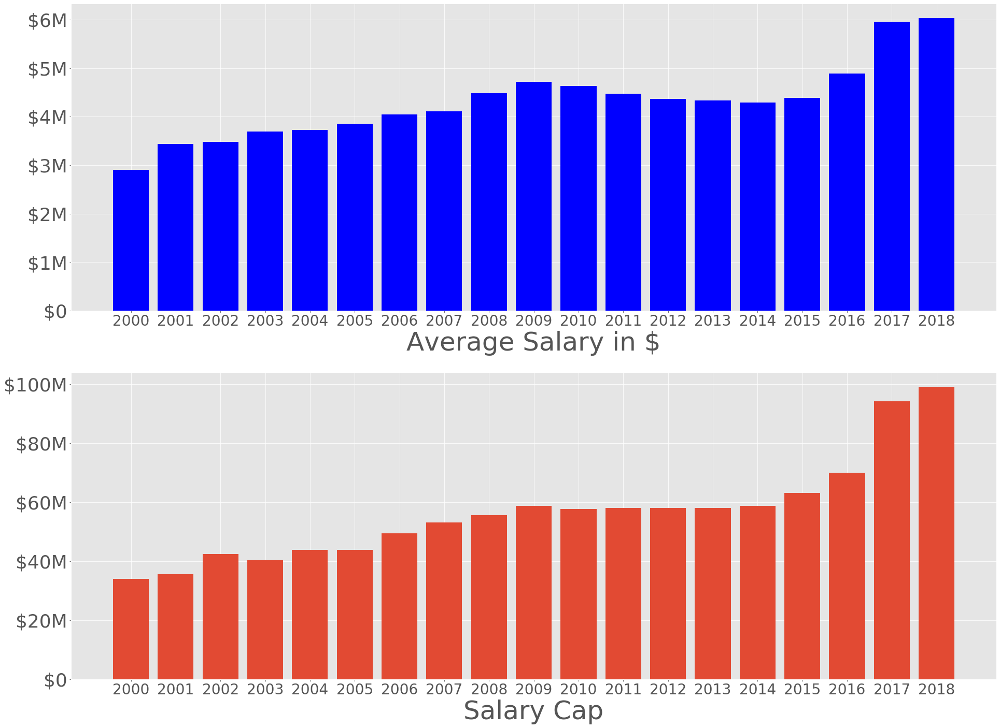

In [128]:
# Ploting average salary and salary cap over the years (Raw $ Amount)

fig, ax = plt.subplots(2,1, figsize=(32,24))
index = np.arange(2000,2019)
xlabel = 50
xtick = 28
ytick = 36

ax[0].bar(index, avgsal, color='b')
ax[0].set_xlabel('Average Salary in $', size=xlabel)

ax[0].set_xticks(index)
ax[0].set_xticklabels(index, size=xtick)
ax[0].set_yticklabels(['$0', '$1M', '$2M', '$3M', '$4M', '$5M', '$6M'], size=ytick)


ax[1].bar(index, avgcap)
ax[1].set_xlabel('Salary Cap', size=xlabel)

ax[1].set_xticks(index)
ax[1].set_xticklabels(index, size=xtick)

ax[1].set_yticklabels(['$0', '$20M', '$40M', '$60M', '$80M', '$100M'], size=ytick)
plt.show()

### Normalizing Salary

In [129]:
dftrnorm = dftrc.copy()
dftenorm = dftest.copy()

In [130]:
dftrnorm['Salary'] = dftrnorm['Salary'] / dftrnorm['SalaryCap']
dftenorm['Salary'] = dftenorm['Salary'] / dftenorm['SalaryCap']

#### Trained set  = dftrnorm
#### Test set = dftenorm

In [131]:
dftrnorm.describe()

,Age,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Salary,Year,SalaryCap
count,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8410.000000,8.410000e+03
mean,26.752081,54.567063,26.783115,20.680654,3.084590,6.901653,0.435734,0.551605,1.574649,0.237759,2.533008,5.326801,0.459725,0.472563,1.518811,2.027503,0.704992,0.975065,2.648490,3.621546,1.811938,0.649096,0.421272,1.193662,1.868740,8.237669,0.078099,2009.291320,5.743522e+07
std,4.360932,24.386546,29.465082,9.975624,2.164219,4.609552,0.092286,0.658720,1.733465,0.177194,1.930879,3.862041,0.098244,0.094116,1.413755,1.780977,0.185792,0.821170,1.787959,2.481685,1.794588,0.443301,0.481641,0.787362,0.794013,5.925179,0.084449,5.527951,1.720001e+07
min,18.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000133,2000.000000,3.400000e+07
25%,23.000000,36.000000,1.000000,12.400000,1.400000,3.300000,0.399000,0.000000,0.100000,0.000000,1.100000,2.400000,0.425000,0.442000,0.500000,0.800000,0.651000,0.400000,1.400000,1.800000,0.600000,0.300000,0.100000,0.600000,1.300000,3.700000,0.018167,2005.000000,4.387000e+07
50%,26.000000,62.000000,12.000000,20.200000,2.600000,5.800000,0.438000,0.300000,1.000000,0.300000,2.000000,4.300000,0.467000,0.481000,1.100000,1.500000,0.750000,0.700000,2.300000,3.000000,1.200000,0.600000,0.300000,1.000000,1.900000,6.800000,0.046408,2009.000000,5.770000e+07
75%,30.000000,76.000000,54.000000,28.900000,4.300000,9.600000,0.479000,0.900000,2.700000,0.365000,3.600000,7.400000,0.505000,0.517000,2.000000,2.700000,0.815000,1.400000,3.500000,4.800000,2.400000,0.900000,0.500000,1.600000,2.400000,11.600000,0.109446,2014.000000,5.868000e+07
max,42.000000,85.000000,83.000000,43.700000,12.200000,27.800000,1.000000,5.100000,11.200000,1.000000,12.100000,23.400000,1.000000,1.500000,9.400000,13.100000,1.000000,5.500000,11.500000,16.300000,11.700000,2.900000,3.700000,5.700000,5.000000,35.400000,0.638686,2018.000000,9.909300e+07


In [132]:
avgsalnorm = dftrnorm.groupby('Year').mean()['Salary']

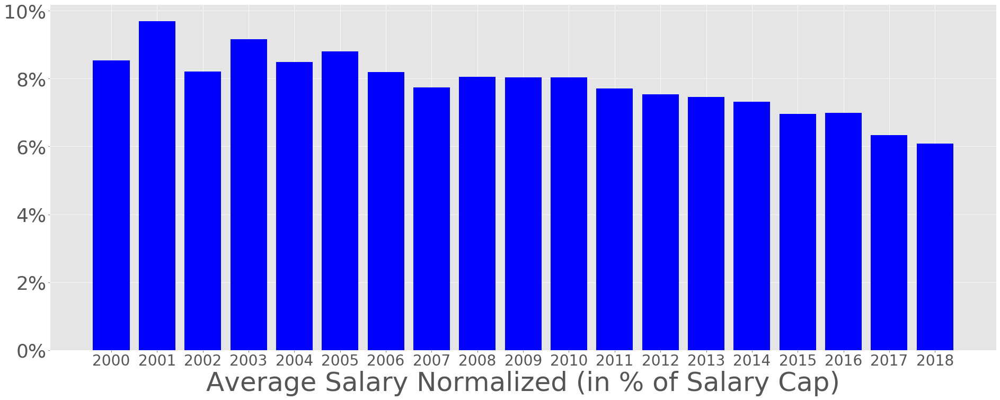

In [133]:
# Ploting average salary after normalization

fig, ax = plt.subplots(figsize=(32,12))
index = np.arange(2000,2019)
xlabel = 50
xtick = 28
ytick = 36

ax.bar(index, avgsalnorm, color='b')
ax.set_xlabel('Average Salary Normalized (in % of Salary Cap)', size=xlabel)

ax.set_xticks(index)
ax.set_xticklabels(index, size=xtick)
ax.set_yticklabels(['0%', '2%', '4%', '6%', '8%', '10%'], size=ytick)
plt.show()

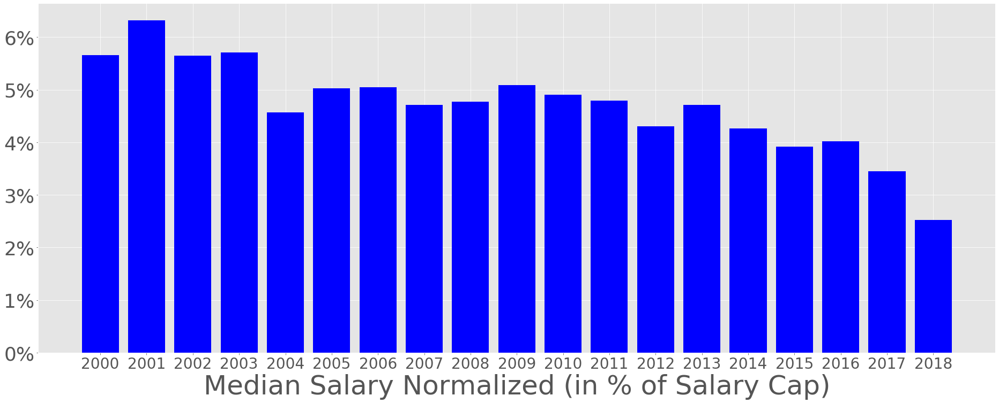

In [135]:
# Median of dataset
medsal = dftrnorm.groupby('Year').median()['Salary']

# Plotting Median salary

fig, ax = plt.subplots(figsize=(32,12))
index = np.arange(2000,2019)
xlabel = 50
xtick = 28
ytick = 36

ax.bar(index, medsal, color='b')
ax.set_xlabel('Median Salary Normalized (in % of Salary Cap)', size=xlabel)

ax.set_xticks(index)
ax.set_xticklabels(index, size=xtick)
ax.set_yticklabels(['0%', '1%', '2%', '3%', '4%', '5%', '6%'], size=ytick)
plt.show()

In [136]:
# Top 10 paid players after normalization
dftrnorm.sort_values('Salary', ascending=False).head(10)

,id,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Salary,Year,SalaryCap
1800,KevinGarnett2004,KevinGarnett,PF,27,MIN,82,82,39.4,9.8,19.6,0.499,0.1,0.5,0.256,9.7,19.1,0.506,0.502,4.5,5.7,0.791,3.0,10.9,13.9,5.0,1.5,2.2,2.6,2.5,24.2,0.638686,2004,43840000
2369,ShaquilleONeal2005,ShaquilleONeal,C,32,MIA,73,73,34.1,9.0,15.0,0.601,0.0,0.0,0.000,9.0,15.0,0.601,0.601,4.8,10.5,0.461,3.5,6.9,10.4,2.7,0.5,2.3,2.8,3.6,22.9,0.631330,2005,43870000
1386,KevinGarnett2003,KevinGarnett,PF,26,MIN,82,82,40.5,9.1,18.1,0.502,0.2,0.9,0.282,8.8,17.2,0.513,0.508,4.6,6.1,0.751,3.0,10.5,13.4,6.0,1.4,1.6,2.8,2.4,23.0,0.625760,2003,40271000
1528,ShaquilleONeal2003,ShaquilleONeal,C,30,LAL,67,66,37.8,10.4,18.1,0.574,0.0,0.0,0.000,10.4,18.1,0.574,0.574,6.7,10.8,0.622,3.9,7.2,11.1,3.1,0.6,2.4,2.9,3.4,27.5,0.585320,2003,40271000
1945,ShaquilleONeal2004,ShaquilleONeal,C,31,LAL,67,67,36.8,8.3,14.1,0.584,0.0,0.0,0.000,8.3,14.1,0.584,0.584,4.9,10.1,0.490,3.7,7.8,11.5,2.9,0.5,2.5,2.9,3.4,21.5,0.564553,2004,43840000
556,KevinGarnett2001,KevinGarnett,PF,24,MIN,81,81,39.5,8.7,18.2,0.477,0.2,0.8,0.288,8.5,17.4,0.486,0.484,4.4,5.8,0.764,2.7,8.7,11.4,5.0,1.4,1.8,2.8,2.5,22.0,0.552394,2001,35500000
705,ShaquilleONeal2001,ShaquilleONeal,C,28,LAL,74,74,39.5,11.0,19.2,0.572,0.0,0.0,0.000,11.0,19.2,0.573,0.572,6.7,13.1,0.513,3.9,8.8,12.7,3.7,0.6,2.8,2.9,3.5,28.7,0.543260,2001,35500000
981,KevinGarnett2002,KevinGarnett,PF,25,MIN,81,81,39.2,8.1,17.3,0.470,0.5,1.4,0.319,7.7,15.9,0.484,0.484,4.4,5.5,0.801,3.0,9.1,12.1,5.2,1.2,1.6,2.8,2.3,21.2,0.527059,2002,42500000
6071,KobeBryant2014,KobeBryant,SG,35,LAL,6,6,29.5,5.2,12.2,0.425,0.5,2.7,0.188,4.7,9.5,0.491,0.445,3.0,3.5,0.857,0.3,4.0,4.3,6.3,1.2,0.2,5.7,1.5,13.8,0.518976,2014,58679000
1426,JuwanHoward2003,JuwanHoward,PF,29,DEN,77,77,35.5,7.4,16.4,0.450,0.0,0.1,0.500,7.3,16.3,0.449,0.450,3.7,4.6,0.803,2.4,5.2,7.6,3.0,1.0,0.4,2.5,3.1,18.4,0.512155,2003,40271000


In [137]:
dftrnorm.sort_values('MP', ascending=False).head(10)

,id,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Salary,Year,SalaryCap
1027,AllenIverson2002,AllenIverson,SG,26,PHI,60,59,43.7,11.1,27.8,0.398,1.3,4.5,0.291,9.8,23.4,0.419,0.422,7.9,9.8,0.812,0.7,3.8,4.5,5.5,2.8,0.2,4.0,1.7,31.4,0.264706,2002,42500000
2700,AllenIverson2006,AllenIverson,PG,30,PHI,72,72,43.1,11.3,25.3,0.447,1.0,3.1,0.323,10.3,22.2,0.465,0.467,9.4,11.5,0.814,0.6,2.6,3.2,7.4,1.9,0.1,3.4,1.7,33.0,0.332386,2006,49500000
2710,LeBronJames2006,LeBronJames,SF,21,CLE,79,79,42.5,11.1,23.1,0.480,1.6,4.8,0.335,9.5,18.3,0.518,0.515,7.6,10.3,0.738,0.9,6.1,7.0,6.6,1.6,0.8,3.3,2.3,31.4,0.093370,2006,49500000
3142,AllenIverson2007,AllenIverson,SG,31,TOT,65,64,42.5,8.9,20.2,0.442,1.0,3.0,0.315,8.0,17.2,0.465,0.466,7.5,9.4,0.795,0.4,2.6,3.0,7.2,1.9,0.2,4.1,1.5,26.3,0.323410,2007,53135000
1850,AllenIverson2004,AllenIverson,SG,28,PHI,48,47,42.5,9.1,23.4,0.387,1.2,4.1,0.286,7.9,19.3,0.408,0.412,7.1,9.5,0.745,0.7,3.0,3.7,6.8,2.4,0.1,4.4,1.8,26.4,0.307938,2004,43840000
1434,AllenIverson2003,AllenIverson,SG,27,PHI,82,82,42.5,9.8,23.7,0.414,1.0,3.7,0.277,8.8,20.0,0.440,0.436,7.0,9.0,0.774,0.8,3.4,4.2,5.5,2.7,0.2,3.5,1.8,27.6,0.307293,2003,40271000
2280,LeBronJames2005,LeBronJames,SF,20,CLE,80,80,42.4,9.9,21.1,0.472,1.4,3.9,0.351,8.6,17.2,0.499,0.504,6.0,8.0,0.750,1.4,6.0,7.4,7.2,2.2,0.7,3.3,1.8,27.2,0.098481,2005,43870000
2271,AllenIverson2005,AllenIverson,PG,29,PHI,75,75,42.3,10.3,24.2,0.424,1.4,4.5,0.308,8.9,19.7,0.451,0.453,8.7,10.5,0.835,0.7,3.3,4.0,7.9,2.4,0.1,4.6,1.9,30.7,0.333371,2005,43870000
2525,GilbertArenas2006,GilbertArenas,PG,24,WAS,80,80,42.3,9.3,20.9,0.447,2.5,6.8,0.369,6.8,14.1,0.485,0.507,8.2,10.0,0.820,0.7,2.8,3.5,6.1,2.0,0.3,3.7,3.6,29.3,0.206933,2006,49500000
127,MichaelFinley2000,MichaelFinley,SF,26,DAL,82,82,42.2,9.1,20.0,0.457,1.2,3.0,0.401,7.9,16.9,0.467,0.487,3.2,3.9,0.820,1.5,4.8,6.3,5.3,1.3,0.4,2.4,2.1,22.6,0.211765,2000,34000000


### Identifying correlations to salary

In [139]:
# Ordering correlations to wining.
dftrnorm.corr()['Salary'].sort_values(ascending=False)

Salary       1.000000
FG           0.613130
PTS          0.609856
2P           0.608373
2PA          0.607209
FGA          0.597537
MP           0.579595
FTA          0.579330
FT           0.570424
DRB          0.559444
TOV          0.551039
GS           0.521695
TRB          0.518254
AST          0.415592
STL          0.401597
PF           0.398637
ORB          0.347731
BLK          0.346475
Age          0.326775
G            0.306243
3PA          0.236150
3P           0.231143
FT%          0.181308
FG%          0.172729
eFG%         0.149996
2P%          0.146889
3P%          0.075433
SalaryCap   -0.097136
Year        -0.097490
Name: Salary, dtype: float64

In [140]:
dftrnorm

,id,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Salary,Year,SalaryCap
0,TariqAbdul-Wahad2000,TariqAbdul-Wahad,SG,25,TOT,61,56,25.9,4.5,10.6,0.424,0.0,0.4,0.130,4.4,10.2,0.435,0.426,2.4,3.2,0.756,1.7,3.1,4.8,1.6,1.0,0.5,1.7,2.4,11.4,0.046909,2000,34000000
1,ShareefAbdur-Rahim2000,ShareefAbdur-Rahim,SF,23,VAN,82,82,39.3,7.2,15.6,0.465,0.4,1.2,0.302,6.9,14.4,0.478,0.477,5.4,6.7,0.809,2.7,7.4,10.1,3.3,1.1,1.1,3.0,3.0,20.3,0.264706,2000,34000000
2,CoryAlexander2000,CoryAlexander,PG,26,DEN,29,2,11.3,1.0,3.4,0.286,0.3,1.2,0.257,0.7,2.2,0.302,0.332,0.6,0.8,0.773,0.3,1.2,1.4,2.0,0.8,0.1,1.0,1.3,2.8,0.058235,2000,34000000
3,RayAllen2000,RayAllen,SG,24,MIL,82,82,37.4,7.8,17.2,0.455,2.1,5.0,0.423,5.7,12.2,0.468,0.516,4.3,4.9,0.887,1.0,3.4,4.4,3.8,1.3,0.2,2.2,2.3,22.1,0.264706,2000,34000000
4,RaferAlston2000,RaferAlston,PG,23,MIL,27,0,13.4,1.0,3.5,0.284,0.1,0.5,0.214,0.9,3.0,0.296,0.300,0.1,0.1,0.750,0.2,0.7,0.9,2.6,0.4,0.0,1.1,1.1,2.2,0.008879,2000,34000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8405,CodyZeller2018,CodyZeller,C,25,CHO,33,0,19.0,2.6,4.7,0.545,0.1,0.1,0.667,2.5,4.6,0.542,0.551,1.8,2.6,0.718,2.0,3.3,5.4,0.9,0.4,0.6,1.0,2.5,7.1,0.126995,2018,99093000
8406,TylerZeller2018,TylerZeller,C,28,TOT,66,34,16.8,2.8,5.1,0.560,0.2,0.4,0.357,2.7,4.6,0.578,0.575,0.9,1.2,0.722,1.7,3.0,4.6,0.7,0.2,0.5,0.7,1.9,6.7,0.017252,2018,99093000
8407,PaulZipser2018,PaulZipser,SF,23,CHI,54,12,15.3,1.5,4.3,0.346,0.7,2.0,0.336,0.8,2.3,0.355,0.425,0.4,0.5,0.760,0.2,2.2,2.4,0.9,0.4,0.3,0.8,1.6,4.0,0.013246,2018,99093000
8408,AnteZizic2018,AnteZizic,C,21,CLE,32,2,6.7,1.5,2.1,0.731,0.0,0.0,0.000,1.5,2.1,0.731,0.731,0.7,0.9,0.724,0.8,1.1,1.9,0.2,0.1,0.4,0.3,0.9,3.7,0.016603,2018,99093000


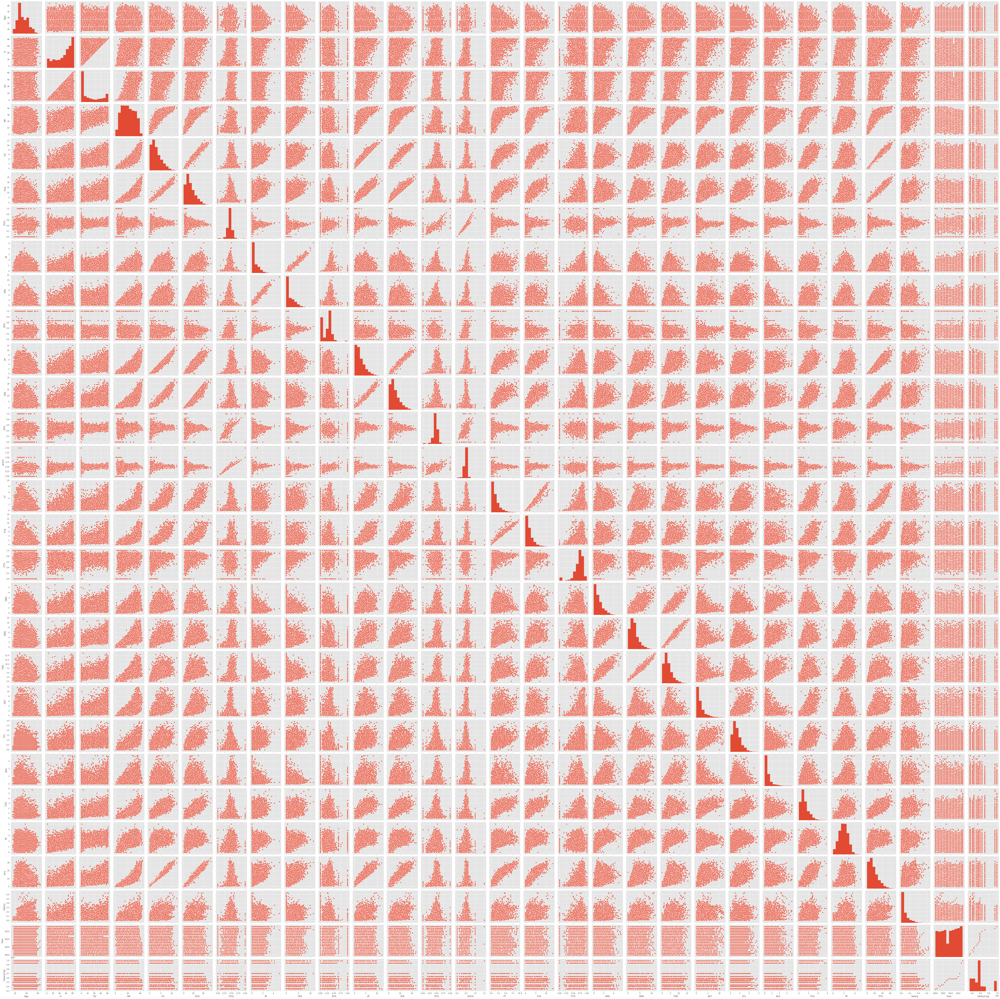

In [21]:
# sns.pairplot(dftrnorm);

### Checking salary distribution

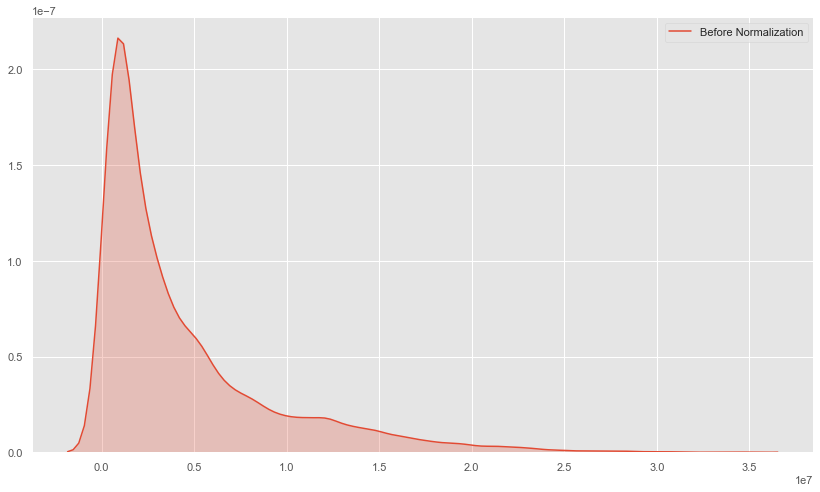

In [1597]:
# Before normalization

fig, ax = plt.subplots(figsize=(14,8))
label = 20
sns.kdeplot(dftrc['Salary'], shade=True, label='Before Normalization')
# ax.set_xlabel("Salary in % of Salary Cap", fontsize=label)

# ax.set_xlim(-0.05,0.7)
plt.show()   

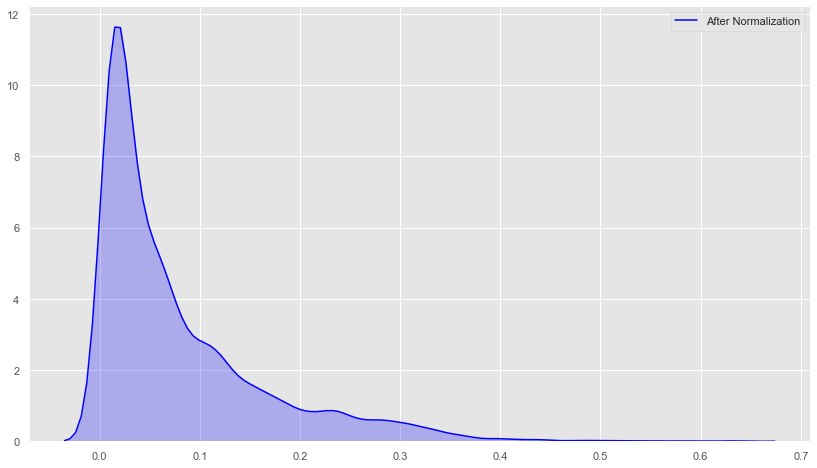

In [1599]:
# After normalization

fig, ax = plt.subplots(figsize=(14,8))
label = 20
sns.kdeplot(dftrnorm['Salary'], shade=True, color='blue', label='After Normalization')
# ax.set_xlabel("Salary in % of Salary Cap", fontsize=label)

# ax.set_xlim(-0.05,0.7)
plt.show()   

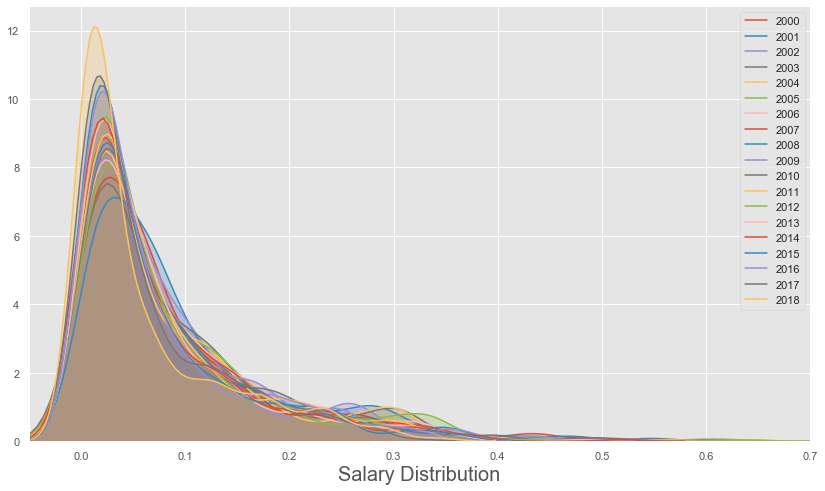

In [1600]:
fig, ax = plt.subplots(figsize=(14,8))
label = 20
for year in dftrnorm['Year'].unique():
    sns.kdeplot(dftrnorm[(dftrnorm['Year'] == year)]['Salary'] , shade=True, label='{}'.format(year))

ax.set_xlabel("Salary Distribution", fontsize=label)

ax.set_xlim(-0.05,0.7)
plt.show()   

In [142]:
# Mode of dataset
dftrnorm.groupby('Year').Salary.apply(lambda x: x.mode())

Year   
2000  0    0.015000
2001  0    0.008929
2002  0    0.007831
2003  0    0.008678
2004  0    0.008370
2005  0    0.008782
      1    0.014134
2006  0    0.008056
2007  0    0.007767
2008  0    0.007679
2009  0    0.012125
2010  0    0.007930
2011  0    0.008159
2012  0    0.008159
2013  0    0.008159
2014  0    0.008354
2015  0    0.008045
2016  0    0.012072
2017  0    0.005773
2018  0    0.000780
Name: Salary, dtype: float64

#### Trained set  = dftrnorm
#### Test set = dftenorm

# 3. Data Preparation

### Get dummy variable for position

In [1459]:
dftrdum = pd.get_dummies(dftrnorm, columns=['Pos'])
dftedum = pd.get_dummies(dftenorm, columns=['Pos'])

In [1432]:
### Change Year format to date
# dftrdum['Year'] = pd.to_datetime(dftrdum.Year, format='%Y')
# dftedum['Year'] = pd.to_datetime(dftedum.Year, format='%Y')

### Dummy
#### Trained set  = dftrdum
#### Test set = dftedum

# 4. Evaluation

### A. Dumb model: Using 2000-2018 average salary to predict 2019 salary

In [1083]:
salarycap2019 = 101869000

XX = dftedum[colused1]
yy = dftedum['Salary']
y_all_train = dftrdum['Salary']

dumb_pred = pd.Series(np.mean(y_all_train)).repeat(len(yy)).reset_index(drop=True)

dumb_rmse = np.sqrt(mean_squared_error(yy, dumb_pred))
print('Dumb model RMSE: {}'.format(dumb_rmse))

print('Dumb model error in USD: ${:,.0f}'.format(dumb_rmse*salarycap2019))

Dumb model RMSE: 0.07845134283131264
Dumb model error in USD: $7,991,760


In [1325]:
def residual_plot(ax, XX, yy, yy_pred, n_bins=50):
    x = np.arange(len(XX))
    residuals = yy - yy_pred
    ax.axhline(0, color="grey", linestyle="--")
    ax.scatter(x, residuals, color='b', alpha=0.5)
    ax.set_ylabel("Residuals in % of Salary Cap")
    ax.set_xticks([]) 

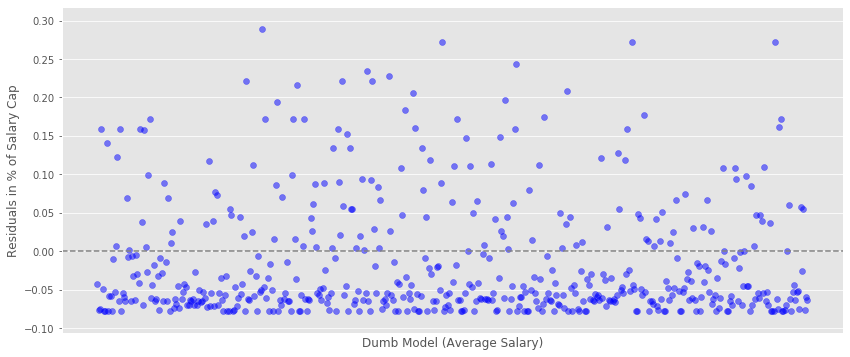

In [1133]:
fig, ax = plt.subplots(figsize=(14, 6))
residual_plot(ax, XX, yy, dumb_pred)
ax.set_xlabel('Dumb Model (Average Salary)')

plt.show()

### B. Model Selection 

#### Test Linear Regression, Random Forest, Gradient Boosting, Ada Boost, XG Boost

In [488]:
from sklearn.pipeline import Pipeline, make_pipeline, FeatureUnion
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder
from sklearn.compose import make_column_transformer, make_column_selector, ColumnTransformer
from sklearn.base import clone

from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.metrics import mean_squared_error, mean_squared_log_error, roc_auc_score, roc_curve, confusion_matrix

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.feature_selection import SelectKBest
import xgboost as xgb

In [546]:
def plot_feat_importance(model, column):
    feat_scores = pd.DataFrame({'Fraction of Samples Affected' : model.feature_importances_},
                           index=column)
    feat_scores = feat_scores.sort_values(by='Fraction of Samples Affected')
    feat_scores.plot(kind='barh', figsize=(12,8))
    plt.legend(loc='lower right')
    plt.xlabel('{}'.format(type(model)))

In [1494]:
def model_check(model, train_data, test_data, column, plot=False):
    # X and Y for train and test
    X = train_data[column]
    y = train_data['Salary']
    
    XX = test_data[column]
    yy = test_data['Salary']    
    
    # Train and test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Cross val score
    cross_score = -np.mean(cross_val_score(model, 
                                           X_train, 
                                           y_train, 
                                           scoring='neg_root_mean_squared_error'))
    print('Cross Val Score: {}'.format(cross_score))
    
    # Test set
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    test_set = np.sqrt(mean_squared_error(y_test, y_pred))
    print('Test Set Score:  {}'.format(test_set))
    
    # Validation set
    yy_pred = model.predict(XX)
    rmse = np.sqrt(mean_squared_error(yy, yy_pred))
    print('Actual Score:    {}'.format(rmse))
    
    if plot == True and (type(model) == RandomForestRegressor or type(model) == GradientBoostingRegressor or type(model) == AdaBoostRegressor):
        plot_feat_importance(model,column)

In [1496]:
# All columns 
colused1 = ['Age', 'G', 'GS', 'MP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P', '2PA', 
            '2P%', 'eFG%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK',
            'TOV', 'PF', 'PTS', 'Year', 'Pos_C', 'Pos_PF', 'Pos_PG', 'Pos_SF']

excluded = ['id', 'Player', 'Tm', 'SalaryCap', 'Pos_SG']

Cross Val Score: 0.05159643265727627
Test Set Score:  0.05062339732446096
Actual Score:    0.04886530976779534


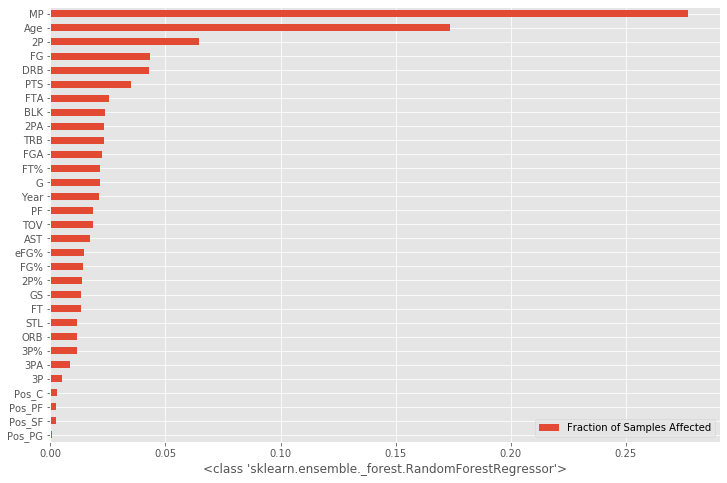

In [565]:
model_check(rf, dftrdum, dftedum, colused1)

Cross Val Score: 0.052006772246815006
Test Set Score:  0.05073940744727147
Actual Score:    0.04680667567527017


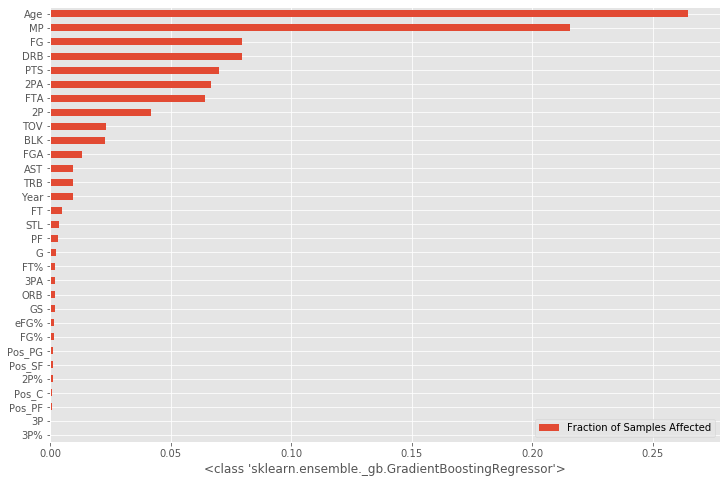

In [566]:
model_check(gb, dftrdum, dftedum, colused1)

Cross Val Score: 0.07717371273262245
Test Set Score:  0.07859930786482881
Actual Score:    0.07585815213949962


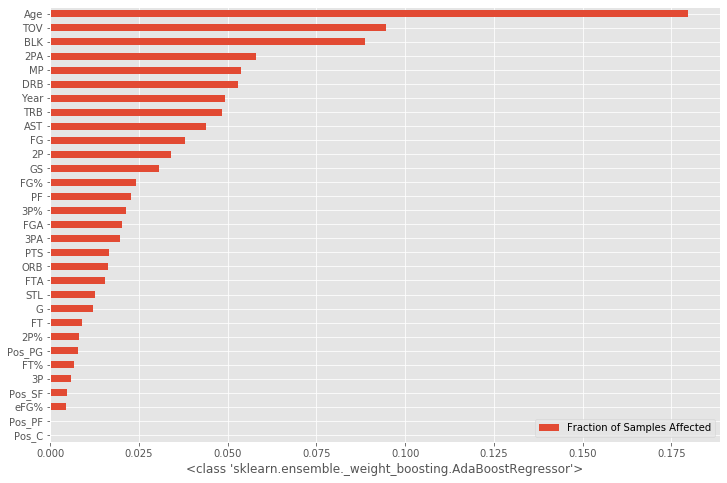

In [567]:
model_check(ad, dftrdum, dftedum, colused1)

##### XG Boost

In [1570]:
X = dftrdum[colused1]
y = dftrdum['Salary']

XX = dftedum[colused1]
yy = dftedum['Salary']    

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [1571]:
data_dmatrix = xgb.DMatrix(data=X,label=y)

In [1572]:
xg_reg = xgb.XGBRegressor()

In [1573]:
xg_reg = xgb.XGBRegressor(objective = 'reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.01,
                max_depth = 10, alpha = 0, n_estimators = 100)

In [1574]:
xg_reg.fit(X_train,y_train)

XGBRegressor(alpha=0, base_score=0.5, booster=None, colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.3, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints=None,
             learning_rate=0.01, max_delta_step=0, max_depth=10,
             min_child_weight=1, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=0, num_parallel_tree=1,
             objective='reg:squarederror', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method=None,
             validate_parameters=False, verbosity=None)

In [1575]:
preds = xg_reg.predict(X_test)

In [1576]:
rmse = np.sqrt(mean_squared_error(y_test, preds))

In [1577]:
rmse

0.16739508598011468

In [1578]:
predsxg = xg_reg.predict(XX)
rmsexg = np.sqrt(mean_squared_error(yy, predsxg))
rmsexg

0.17642684257825603

#### Model Selection: Gradient Boosting

### C. Features Selection

In [1179]:
colused2 = ['Age', 'MP', 'PTS', 'DRB', 'FG', 'G', 'FTA', '2P', '2PA', 'Year'] # Top 10 important features
colused3 = ['Age', 'MP', 'PTS', 'DRB', 'FG'] # Top 5 important features
colused4 = ['Age','G','TRB','MP','FTA','Year'] # Best performers
colused5 = ['Age','MP'] # Top 2 important
colused6 = ['Age','GS','TRB','MP','FTA','Year'] # Swapped G and GS from colused4
colused7 = ['Age','G','TRB', 'PTS', 'MP','Year'] # Swapped FTA and PTS from colused4
colused8 = ['Age','G','TRB', 'MP','Year'] # Removed PTS from colused7
colused9 = ['Age','G','TRB','MP','FTA'] # Removed Year from colused4

In [1265]:
gb = GradientBoostingRegressor()

In [1267]:
model_check(gb, dftrdum, dftedum, colused4)

Cross Val Score: 0.05377883377242505
Test Set Score:  0.05292386140400983
Actual Score:    0.046578403756043774


#### Best features = colused4

#### Trained set = dftrdum

#### Test set = dftedum

### D. Dataset selection

In [1198]:
def return_rmse(model, train_data, test_data, column, plot=False):
    # X and Y for train and test
    X = train_data[column]
    y = train_data['Salary']
    
    XX = test_data[column]
    yy = test_data['Salary']    
    
    # Train and test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Predict
    model.fit(X_train, y_train)
    yy_pred = model.predict(XX)
    rmse = np.sqrt(mean_squared_error(yy, yy_pred))
    return rmse

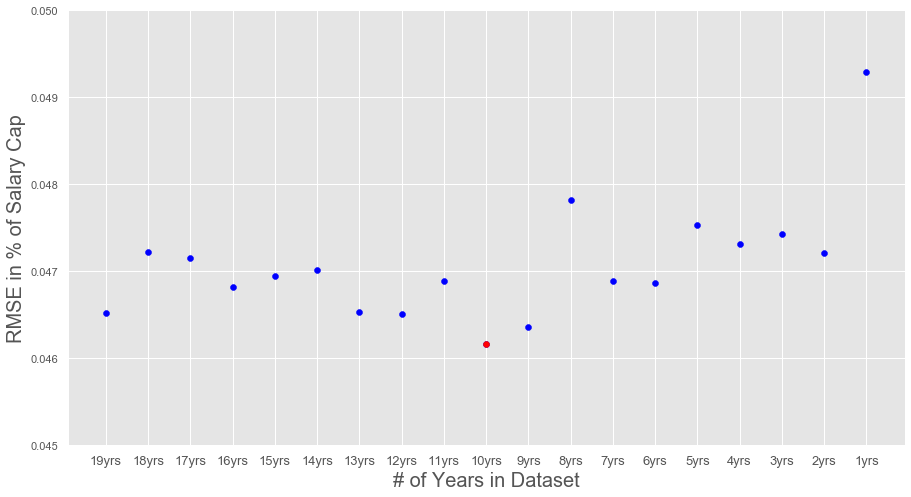

In [1340]:
fig, ax = plt.subplots(figsize=(15,8))
x = np.arange(2000,2019)
datayears = np.arange(19,0,-1)
ticks=13
label=20
# y_lst = []
# for year in x:
#     gb = GradientBoostingRegressor()
#     train_set = dftrdum[(dftrdum['Year'] >= year)]
#     y = return_rmse(gb, train_set, dftedum, colused4)
#     y_lst.append(y)

minindex = x[y_lst.index(min(y_lst))]
ax.scatter(x,y_lst, color='blue')
ax.scatter(minindex, min(y_lst), color='red')
ax.set_xticks(x)
ax.set_xticklabels(['{}yrs'.format(i) for i in datayears], size=ticks)
ax.set_xlabel('# of Years in Dataset',size=label)
# ax.axhline(0.04681, color="grey", linestyle="--")
ax.set_ylabel('RMSE in % of Salary Cap',size=label)
ax.set_ylim(0.0450,0.05)
plt.show()

In [1187]:
ten_tr = dftrdum[(dftrdum['Year'] >= 2009)]

rf = RandomForestRegressor()
gb = GradientBoostingRegressor()

In [1188]:
model_check(gb, ten_tr, dftedum, colused4)

Cross Val Score: 0.048752941552605455
Test Set Score:  0.04913484887718785
Actual Score:    0.04615202953115495


#### Best dataset = last 10 years (2009-2018)

### E. Hyperparameter tunning (Gradient Boosting)

In [1579]:
X = ten_tr[colused4]
y = ten_tr['Salary']

XX = dftedum[colused4]
yy = dftedum['Salary']    

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=142)

gb = GradientBoostingRegressor()

In [1563]:
gbparams= {
    'learning_rate':[0.05,0.1],
    'n_estimators':[75,100],
    'min_samples_split':[4,8,12],
    'min_samples_leaf':[1,2],
    'max_depth':[2,3,4,5],
}

In [1564]:
GBGCV = GridSearchCV(gb, 
                     param_grid=gbparams, 
                     scoring='neg_root_mean_squared_error', 
                     verbose=1)

In [1565]:
GBGCV.fit(X_train, y_train)

Fitting 5 folds for each of 96 candidates, totalling 480 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:  1.7min finished


GridSearchCV(cv=None, error_score=nan,
             estimator=GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0,
                                                 criterion='friedman_mse',
                                                 init=None, learning_rate=0.1,
                                                 loss='ls', max_depth=3,
                                                 max_features=None,
                                                 max_leaf_nodes=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100,
                                                 n_ite...
                            

In [1566]:
GBGCV.cv_results_

{'mean_fit_time': array([0.11423492, 0.14628758, 0.10977812, 0.1448256 , 0.11106339,
        0.14469676, 0.11036315, 0.14509711, 0.10877256, 0.14560227,
        0.10908389, 0.14453969, 0.15384016, 0.204004  , 0.15396047,
        0.20496778, 0.15388799, 0.20549006, 0.15406723, 0.20435996,
        0.15383444, 0.20452037, 0.15419102, 0.20430412, 0.19908581,
        0.26443954, 0.19894629, 0.26784978, 0.20011525, 0.26517582,
        0.23291259, 0.27283678, 0.20009646, 0.2657505 , 0.19922223,
        0.26456323, 0.24525752, 0.3266078 , 0.24503655, 0.32618704,
        0.24515495, 0.33398695, 0.24949956, 0.33610969, 0.24589806,
        0.32482991, 0.24428105, 0.32307754, 0.10878606, 0.14423823,
        0.12283707, 0.1480484 , 0.10943074, 0.14450479, 0.10957947,
        0.14517684, 0.10905452, 0.14432034, 0.10860186, 0.14399195,
        0.15315781, 0.20256743, 0.15491629, 0.20287628, 0.15418582,
        0.20264139, 0.15322952, 0.2045167 , 0.15283327, 0.20323749,
        0.1531291 , 0.20329556,

In [1567]:
GBGCV.best_params_

{'learning_rate': 0.1,
 'max_depth': 3,
 'min_samples_leaf': 2,
 'min_samples_split': 8,
 'n_estimators': 75}

In [1568]:
-GBGCV.best_score_

0.04836618016793537

In [1569]:
yy_pred = GBGCV.best_estimator_.predict(XX)
gbmse = np.sqrt(mean_squared_error(yy, yy_pred))
gbmse

0.04602689009072535

#### Trained set = dftrdum
#### Test set = dftedum

## 5. Findings

In [1654]:
df_final = dftedum.copy()
df_final['Salary$M'] = (df_final['Salary'] * df_final['SalaryCap'])/1000000
df_final['PredictedSalary'] = yy_pred
df_final['PredictedSalary$M'] = (df_final['PredictedSalary'] * df_final['SalaryCap'])/1000000
df_final['Residual'] = df_final['Salary'] - df_final['PredictedSalary']
df_final['Residual$M'] = df_final['Salary$M'] - df_final['PredictedSalary$M']
col_final = ['Player', 'Age', 'G', 'TRB', 'MP', 'FTA', 
             'Salary$M', 'PredictedSalary$M', 'Residual$M', 
             'Salary','PredictedSalary','Residual']
df_final = df_final[col_final]

In [1655]:
df_final.sort_values(by='Residual').head(10).reset_index(drop=True)

,Player,Age,G,TRB,MP,FTA,Salary$M,PredictedSalary$M,Residual$M,Salary,PredictedSalary,Residual
0,JaKarrSampson,25,4,8.0,31.8,5.3,0.085457,16.264140,-16.178683,0.000839,0.159657,-0.158819
1,DeMarcusCousins,28,30,8.2,25.7,4.8,5.337000,18.414584,-13.077584,0.052391,0.180767,-0.128376
2,CarmeloAnthony,34,10,5.4,29.4,2.2,2.393887,15.414710,-13.020823,0.023500,0.151319,-0.127819
3,DerrickRose,30,51,2.7,27.3,3.1,2.176260,14.278122,-12.101862,0.021363,0.140162,-0.118798
4,DwyaneWade,37,72,4.0,26.2,3.2,2.393887,14.306894,-11.913007,0.023500,0.140444,-0.116944
5,JaValeMcGee,31,75,7.5,22.3,2.0,2.393887,13.673830,-11.279943,0.023500,0.134230,-0.110730
6,PascalSiakam,24,80,6.9,31.9,3.8,1.544951,12.040818,-10.495867,0.015166,0.118199,-0.103033
7,JeffGreen,32,77,4.0,27.2,2.7,2.393887,11.858970,-9.465083,0.023500,0.116414,-0.092914
8,TylerZeller,29,6,4.0,15.5,3.0,0.213948,9.637121,-9.423173,0.002100,0.094603,-0.092503
9,EdDavis,29,81,8.6,17.9,2.0,4.449000,13.007287,-8.558287,0.043674,0.127686,-0.084013


In [1656]:
df_final.sort_values(by='Residual', ascending=False).head(10).reset_index(drop=True)

,Player,Age,G,TRB,MP,FTA,Salary$M,PredictedSalary$M,Residual$M,Salary,PredictedSalary,Residual
0,GordonHayward,28,72,4.5,25.9,2.6,31.214295,9.509834,21.704461,0.306416,0.093354,0.213062
1,AndrewWiggins,23,73,4.8,34.8,4.1,25.467250,7.684506,17.782744,0.250000,0.075435,0.174565
2,ChandlerParsons,30,25,2.8,19.8,1.0,24.107258,6.521348,17.585910,0.236650,0.064017,0.172633
3,NikolaJokic,23,80,10.8,31.3,4.4,25.467250,7.955332,17.511918,0.250000,0.078094,0.171906
4,OttoPorter,25,56,5.6,30.1,1.7,26.011913,9.505608,16.506305,0.255347,0.093312,0.162035
5,RyanAnderson,30,25,2.2,12.9,0.6,20.421546,4.755251,15.666295,0.200469,0.046680,0.153789
6,JabariParker,23,64,6.6,26.9,2.9,20.000000,5.486545,14.513455,0.196331,0.053859,0.142472
7,ChrisPaul,33,58,4.6,32.0,3.5,35.654150,21.189395,14.464755,0.350000,0.208006,0.141994
8,AlHorford,32,68,6.7,29.0,1.4,28.928710,14.467777,14.460933,0.283980,0.142023,0.141956
9,KyleLowry,32,65,4.8,34.0,3.0,32.700000,18.451543,14.248457,0.321001,0.181130,0.139870


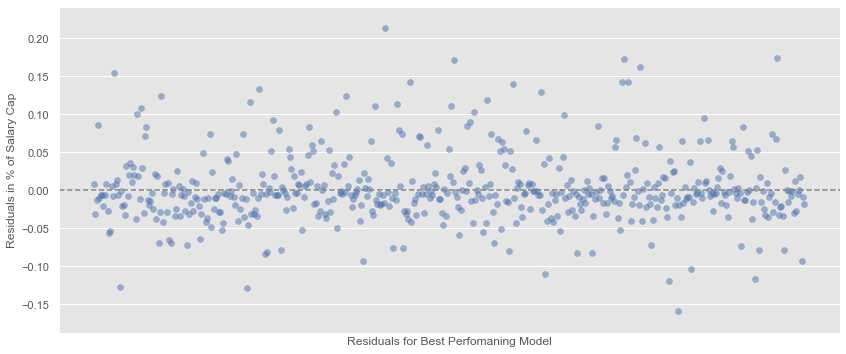

In [1653]:
fig, ax = plt.subplots(figsize=(14, 6))
residual_plot(ax, XX, yy, yy_pred)

ax.set_xlabel('Residuals for Best Perfomaning Model')

plt.show()

In [1633]:
colused4

['Age', 'G', 'TRB', 'MP', 'FTA', 'Year']

In [1651]:
dftedum['Salary']

count    530.000000
mean       0.063987
std        0.077245
min        0.000465
25%        0.013530
50%        0.027058
75%        0.093455
max        0.367699
Name: Salary, dtype: float64

In [1663]:
(0.367699-0.000465)

0.367234

In [1664]:
(0.07845-0.04603)*101869000

3302592.9800000004

In [1665]:
0.00078*101869000

79457.81999999999

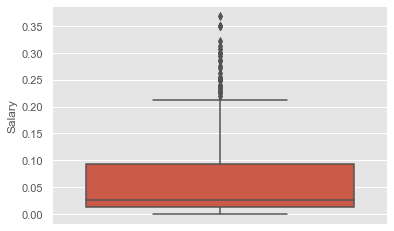

In [1666]:
sns.boxplot(y=dftedum['Salary'] );
plt.show()

---

### TESTING: Separate models for different groups

In [982]:
def model_check_combined(model1, train_data1, test_data1, train_data2, test_data2, column):
    model2 = clone(model1)
    
    # X and Y for train and test
    X1 = train_data1[column]
    y1 = train_data1['Salary']
    
    XX1 = test_data1[column]
    yy1 = test_data1['Salary']    
    
    X2 = train_data2[column]
    y2 = train_data2['Salary']
    
    XX2 = test_data2[column]
    yy2 = test_data2['Salary']      
    
    
    # Train and test split
    X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.2, random_state=42)
    X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=42)
    
    # Cross val score
    cross_score1 = -np.mean(cross_val_score(model1, 
                                           X1_train, 
                                           y1_train, 
                                           scoring='neg_root_mean_squared_error'))
    
    cross_score2 = -np.mean(cross_val_score(model2, 
                                           X2_train, 
                                           y2_train, 
                                           scoring='neg_root_mean_squared_error'))

    # Test set
    model1.fit(X1_train, y1_train)
    y1_pred = model1.predict(X1_test)
    test1_set = np.sqrt(mean_squared_error(y1_test, y1_pred))

    model2.fit(X2_train, y2_train)
    y2_pred = model2.predict(X2_test)
    test2_set = np.sqrt(mean_squared_error(y2_test, y2_pred))

    # Validation set
    yy1_pred = model1.predict(XX1)
    rmse1 = np.sqrt(mean_squared_error(yy1, yy1_pred))

    
    yy2_pred = model2.predict(XX2)
    rmse2 = np.sqrt(mean_squared_error(yy2, yy2_pred))
  
    
    # Combined Result
    denom = len(test_data1)+len(test_data2)
    num1 = len(test_data1)
    num2 = len(test_data2)
    combined_rmse = (rmse1*num1)/(denom) + (rmse2*num2)/(denom)

    
    print('Cross Val Score 1: {}'.format(cross_score1))    
    print('Test Set Score 1:  {}'.format(test1_set))
    print('Actual Score 1:    {}'.format(rmse1))
    print('----------------------')
    print('Cross Val Score 2: {}'.format(cross_score2))
    print('Test Set Score 2:  {}'.format(test2_set))
    print('Actual Score 2:    {}'.format(rmse2))     
    print('----------------------')    
    print('Combined RMSE:     {}'.format(combined_rmse)) 

In [986]:
# Separating Starters and bench
starters_tr = dftrdum[dftrdum['GS'] > 41]
bench_tr = dftrdum[dftrdum['GS'] <= 41]

starters_te = dftedum[dftedum['GS'] > 41]
bench_te = dftedum[dftedum['GS'] <= 41]

rf = RandomForestRegressor()
gb = GradientBoostingRegressor()

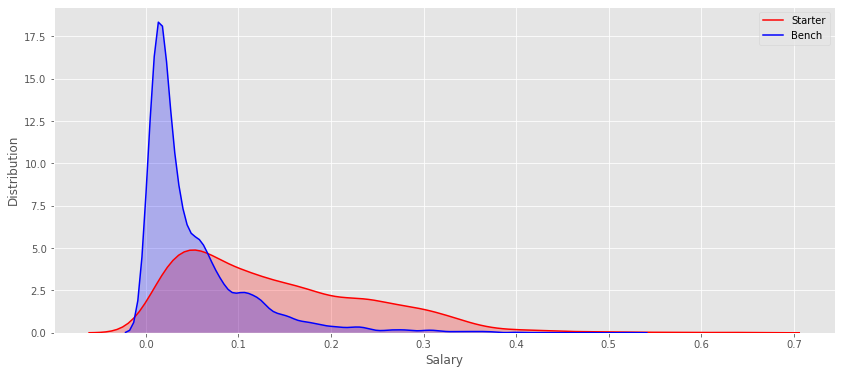

In [817]:
# Plotting starters vs bench 
fig, ax = plt.subplots(figsize=(14,6))
p1=sns.kdeplot(starters_tr['Salary'], shade=True, color="r", label="Starter")
p1=sns.kdeplot(bench_tr['Salary'], shade=True, color="b", label="Bench")

# p1.figure.suptitle("", fontsize=18)
plt.xlabel("Salary", fontsize=12)
plt.ylabel("Distribution", fontsize=12)
plt.show()

In [987]:
model_check_combined(rf, starters_tr, starters_te, bench_tr, bench_te, colused4)

Cross Val Score 1: 0.06939659032871844
Test Set Score 1:  0.07061446991423083
Actual Score 1:    0.060704944004613
----------------------
Cross Val Score 2: 0.045528648642570634
Test Set Score 2:  0.048406429002578515
Actual Score 2:    0.04198360455690625
----------------------
Combined RMSE:     0.04682289418772856


In [988]:
model_check_combined(gb, starters_tr, active_te, bench_tr, bench_te, colused4)

Cross Val Score 1: 0.06838629214521266
Test Set Score 1:  0.07276733782540759
Actual Score 1:    0.05268633703489551
----------------------
Cross Val Score 2: 0.04425665321683039
Test Set Score 2:  0.04683236285796333
Actual Score 2:    0.04254783526089824
----------------------
Combined RMSE:     0.04731648366942256


In [1015]:
# Separating active & non active players
active_tr = dftrdum[dftrdum['G'] > 41]
nonact_tr = dftrdum[dftrdum['G'] <= 41]

active_te = dftedum[dftedum['G'] > 41]
nonact_te = dftedum[dftedum['G'] <= 41]

rf = RandomForestRegressor()
gb = GradientBoostingRegressor()

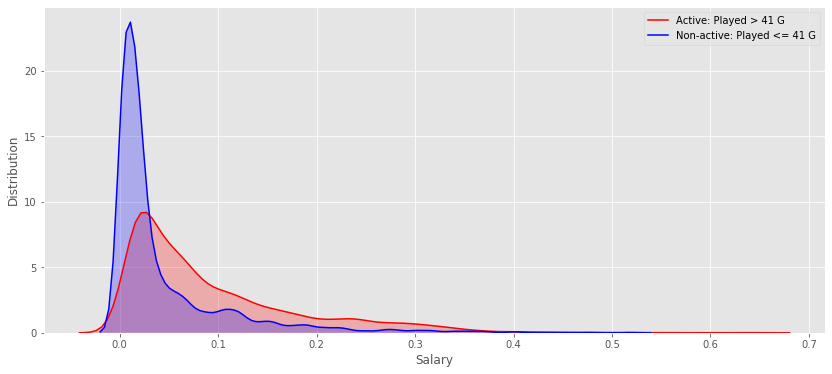

In [943]:
fig, ax = plt.subplots(figsize=(14,6))
p1=sns.kdeplot(active_tr['Salary'], shade=True, color="r", label="Active: Played > 41 G")
p1=sns.kdeplot(nonact_tr['Salary'], shade=True, color="b", label="Non-active: Played <= 41 G")

plt.xlabel("Salary", fontsize=12)
plt.ylabel("Distribution", fontsize=12)
plt.show()

In [1016]:
model_check_combined(rf, active_tr, active_te, nonact_tr, nonact_te, colused4)

Cross Val Score 1: 0.05636291082655868
Test Set Score 1:  0.059640536922365484
Actual Score 1:    0.0500790504086172
----------------------
Cross Val Score 2: 0.049610652693852494
Test Set Score 2:  0.044009985193456044
Actual Score 2:    0.0416704155453236
----------------------
Combined RMSE:     0.04720742227605844


In [1017]:
model_check_combined(gb, active_tr, active_te, nonact_tr, nonact_te, colused4)

Cross Val Score 1: 0.05571929190533899
Test Set Score 1:  0.058421075992989575
Actual Score 1:    0.05089989521851482
----------------------
Cross Val Score 2: 0.048357693500684355
Test Set Score 2:  0.04272820274259104
Actual Score 2:    0.04018711888420033
----------------------
Combined RMSE:     0.04724138103641874


---

### TESTING with Pipeline

In [283]:
dftrnorm

,id,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Salary,Year,SalaryCap
0,TariqAbdul-Wahad2000,TariqAbdul-Wahad,SG,25,TOT,61,56,25.9,4.5,10.6,0.424,0.0,0.4,0.130,4.4,10.2,0.435,0.426,2.4,3.2,0.756,1.7,3.1,4.8,1.6,1.0,0.5,1.7,2.4,11.4,0.046909,2000,34000000
1,ShareefAbdur-Rahim2000,ShareefAbdur-Rahim,SF,23,VAN,82,82,39.3,7.2,15.6,0.465,0.4,1.2,0.302,6.9,14.4,0.478,0.477,5.4,6.7,0.809,2.7,7.4,10.1,3.3,1.1,1.1,3.0,3.0,20.3,0.264706,2000,34000000
2,CoryAlexander2000,CoryAlexander,PG,26,DEN,29,2,11.3,1.0,3.4,0.286,0.3,1.2,0.257,0.7,2.2,0.302,0.332,0.6,0.8,0.773,0.3,1.2,1.4,2.0,0.8,0.1,1.0,1.3,2.8,0.058235,2000,34000000
3,RayAllen2000,RayAllen,SG,24,MIL,82,82,37.4,7.8,17.2,0.455,2.1,5.0,0.423,5.7,12.2,0.468,0.516,4.3,4.9,0.887,1.0,3.4,4.4,3.8,1.3,0.2,2.2,2.3,22.1,0.264706,2000,34000000
4,RaferAlston2000,RaferAlston,PG,23,MIL,27,0,13.4,1.0,3.5,0.284,0.1,0.5,0.214,0.9,3.0,0.296,0.300,0.1,0.1,0.750,0.2,0.7,0.9,2.6,0.4,0.0,1.1,1.1,2.2,0.008879,2000,34000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8405,CodyZeller2018,CodyZeller,C,25,CHO,33,0,19.0,2.6,4.7,0.545,0.1,0.1,0.667,2.5,4.6,0.542,0.551,1.8,2.6,0.718,2.0,3.3,5.4,0.9,0.4,0.6,1.0,2.5,7.1,0.126995,2018,99093000
8406,TylerZeller2018,TylerZeller,C,28,TOT,66,34,16.8,2.8,5.1,0.560,0.2,0.4,0.357,2.7,4.6,0.578,0.575,0.9,1.2,0.722,1.7,3.0,4.6,0.7,0.2,0.5,0.7,1.9,6.7,0.017252,2018,99093000
8407,PaulZipser2018,PaulZipser,SF,23,CHI,54,12,15.3,1.5,4.3,0.346,0.7,2.0,0.336,0.8,2.3,0.355,0.425,0.4,0.5,0.760,0.2,2.2,2.4,0.9,0.4,0.3,0.8,1.6,4.0,0.013246,2018,99093000
8408,AnteZizic2018,AnteZizic,C,21,CLE,32,2,6.7,1.5,2.1,0.731,0.0,0.0,0.000,1.5,2.1,0.731,0.731,0.7,0.9,0.724,0.8,1.1,1.9,0.2,0.1,0.4,0.3,0.9,3.7,0.016603,2018,99093000


In [286]:
dftrnorm.columns.to_list()

['id',
 'Player',
 'Pos',
 'Age',
 'Tm',
 'G',
 'GS',
 'MP',
 'FG',
 'FGA',
 'FG%',
 '3P',
 '3PA',
 '3P%',
 '2P',
 '2PA',
 '2P%',
 'eFG%',
 'FT',
 'FTA',
 'FT%',
 'ORB',
 'DRB',
 'TRB',
 'AST',
 'STL',
 'BLK',
 'TOV',
 'PF',
 'PTS',
 'Salary',
 'Year',
 'SalaryCap']

In [417]:
# Creating Pipeline for Linear and non-linear models. 
# Linear models will drop first in One Hot Encoding.

# cat_features = ['Pos']

# lin_transformer = Pipeline(steps=[('onehot_drop', 
#                                    OneHotEncoder(drop='first',
#                                                  handle_unknown='error'))])

# no_lin_transformer = Pipeline(steps=[('onehot_nodrop', 
#                                       OneHotEncoder(handle_unknown='ignore'))])

# lin_preprocessor = ColumnTransformer(transformers=[('lin_cat', 
#                                                     lin_transformer, 
#                                                     cat_features)])

# non_lin_preprocessor = ColumnTransformer(transformers=[('non_lin_cat', 
#                                                         no_lin_transformer, 
#                                                         cat_features)])

In [401]:
cat_features = ['Pos']

lr_transformer = Pipeline(steps=[('onehot_drop', 
                                   OneHotEncoder(drop='first'))])

transformer = Pipeline(steps=[('onehot_nodrop', 
                                      OneHotEncoder())])

lr_preprocessor = ColumnTransformer(transformers=[('lin_cat', 
                                                    lr_transformer, 
                                                    cat_features)])

preprocessor = ColumnTransformer(transformers=[('non_lin_cat', 
                                                        transformer, 
                                                        cat_features)])

In [418]:
# Min
lr_col_tran = make_column_transformer((
    OneHotEncoder(drop='first'), ['Pos']
))

col_tran = make_column_transformer((
    OneHotEncoder(handle_unknown='ignore'), ['Pos']
))


lr_pipe = make_pipeline((lr_col_tran))
pipe = make_pipeline((col_tran))

In [419]:
lr_pipe = Pipeline([('lin_prep', lr_preprocessor)])
pipe = Pipeline([('non_lin_prep', preprocessor)])

In [420]:
colused2 = [
    'Pos',
    'Age',
 'G',
 'GS',
 'MP',
 'FG',
 'FGA',
 'FG%',
 '3P',
 '3PA',
 '3P%',
 '2P',
 '2PA',
 '2P%',
 'eFG%',
 'FT',
 'FTA',
 'FT%',
 'ORB',
 'DRB',
 'TRB',
 'AST',
 'STL',
 'BLK',
 'TOV',
 'PF',
 'PTS',
 'Year',
]

In [421]:
X = dftrnorm[colused2]
y = dftrnorm['Salary']

In [422]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [423]:
linreg = clone(lr_pipe)
rf = clone(pipe)
gb = clone(pipe)

linreg.steps.append(('linreg', LinearRegression()))
rf.steps.append(['rf', RandomForestRegressor()])
gb.steps.append(['gb', GradientBoostingRegressor()])

In [424]:
model_check(linreg, X_train, y_train, X_test, y_test, XX, yy)

Cross Val Score: 0.08439694605666326
Test Set Score:  0.08325529346220421
Actual Score:    0.07814624839181267


In [410]:
model_check(rf, X_train, y_train, X_test, y_test, XX, yy)

Cross Val Score: 0.08440164660796672
Test Set Score:  0.08325937400257703
Actual Score:    0.07816995568928338


In [ ]:
model_check(rf, X_train, y_train, X_test, y_test, XX, yy)

In [360]:
-np.mean(cross_val_score(linreg, X_train, y_train, scoring='neg_root_mean_squared_error'))

0.08439694605666326

In [412]:
-np.mean(cross_val_score(rf, X_train, y_train, scoring='neg_root_mean_squared_error'))

0.08439689103318446

In [358]:
-np.mean(cross_val_score(gb, X_train, y_train, scoring='neg_root_mean_squared_error'))

0.08439694361191535

In [345]:
linreg.fit(X_train, y_train)
y_pred = linreg.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

0.08325529346220421

In [413]:
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

0.08324957041786807

In [347]:
gb.fit(X_train, y_train)
y_pred = gb.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

0.08325528905203393

In [408]:
XX2 = dftenorm[colused2]
yy2 = dftenorm['Salary']

In [349]:
# Linear Regression
y_pred_ = linreg.predict(XX2)
lrmse = np.sqrt(mean_squared_error(yy2, y_pred_))
lrmse

0.07814624839181267

In [350]:
# Random Forest
y_pred_ = rf.predict(XX2)
lrmse = np.sqrt(mean_squared_error(yy2, y_pred_))
lrmse

0.07816432418485333

In [351]:
# Gradient Boosting
y_pred_ = gb.predict(XX2)
lrmse = np.sqrt(mean_squared_error(yy2, y_pred_))
lrmse

0.0781462507638774